# Pelatihan Model Pengenalan Bahasa Isyarat BISINDO





In [1]:
# Pip Installation
!pip install tensorflowjs kagglehub -q

# Standard Library Imports
import os
import io
import time
import glob
import random
import shutil
import hashlib
from collections import defaultdict

# Data Science & Visualization Imports
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Machine Learning & Deep Learning Imports
import tensorflow as tf
import tensorflowjs as tfjs
from tensorflow.keras.models import Model
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout, Input

from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report

# UI, Utilities & Image Processing Imports
import kagglehub
from tqdm import tqdm
from PIL import Image, ImageOps
import ipywidgets as widgets
from IPython.display import display, clear_output

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 89.1/89.1 kB 3.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.0/53.0 kB 2.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.1/16.1 MB 62.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 645.0/645.0 MB 2.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 32.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 50.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 72.5/72.5 kB 4.6 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
db-dtypes 1.6.0 requires packaging>=24.2.0, but you have packaging 23.2 which is incompatible.
tensorflow-text 2.20.1 requires tensorflow<2.21,>=2.20.0, but you have tensorflow 2.19.0 which is incompatible.
google-cloud-bigquery 3.41.0 requires packaging>=24.2.0, but you have p

## Data Loading

In [2]:
!mkdir -p ~/.kaggle && echo KGAT_a156317fc6f86e944aeaeb8d6096d309 > ~/.kaggle/access_token && chmod 600 ~/.kaggle/access_token

In [3]:
# Download latest version
path = kagglehub.dataset_download("muhammadfathinraihan/bisindo-dataset")

print("Path to dataset files:", path)

100%|██████████| 7.87G/7.87G [01:57<00:00, 71.6MB/s]

Extracting files...


Path to dataset files: /root/.cache/kagglehub/datasets/muhammadfathinraihan/bisindo-dataset/versions/1


In [4]:
dataset_path = path + '/BISINDO Indonesian Sign Language Alphabet Image Data/01. Original Images'
print(dataset_path)

/root/.cache/kagglehub/datasets/muhammadfathinraihan/bisindo-dataset/versions/1/BISINDO Indonesian Sign Language Alphabet Image Data/01. Original Images


In [5]:
def fix_exif_orientation(dataset_dir):
    print(f"Memulai pemindaian EXIF di folder: {dataset_dir}")
    gambar_diperbaiki = 0
    gambar_error = 0

    # os.walk akan menelusuri folder utama dan semua subfoldernya (A-Z)
    for root, dirs, files in os.walk(dataset_dir):
        for file in files:
            # Hanya proses file gambar
            if file.lower().endswith(('.png', '.jpg', '.jpeg')):
                filepath = os.path.join(root, file)

                try:
                    img = Image.open(filepath)
                    img_fixed = ImageOps.exif_transpose(img)

                    if img_fixed != img:
                        img_fixed.save(filepath, quality=100)
                        gambar_diperbaiki += 1

                except Exception as e:
                    gambar_error += 1

    print("\nPembersihan EXIF Selesai!")
    print(f"Total gambar yang berhasil diperbaiki: {gambar_diperbaiki}")
    print(f"Total error: {gambar_error}")

fix_exif_orientation(dataset_path)

Memulai pemindaian EXIF di folder: /root/.cache/kagglehub/datasets/muhammadfathinraihan/bisindo-dataset/versions/1/BISINDO Indonesian Sign Language Alphabet Image Data/01. Original Images

Pembersihan EXIF Selesai!
Total gambar yang berhasil diperbaiki: 4466
Total error: 297


In [6]:
def set_seed(seed=42):
    # 1. Set environment variable untuk Python hashing
    os.environ['PYTHONHASHSEED'] = str(seed)

    # 2. Set seed untuk built-in Python random
    random.seed(seed)

    # 3. Set seed untuk NumPy
    np.random.seed(seed)

    # 4. Set seed untuk TensorFlow (Mencakup inisialisasi layer & augmentasi TF)
    tf.random.set_seed(seed)

    # 5. Opsional: Memastikan operasi deterministik jika didukung GPU (bisa memperlambat training)
    # os.environ['TF_DETERMINISTIC_OPS'] = '1'

    print(f"Semua seed berhasil diseragamkan ke nilai: {seed}")

# Panggil fungsi ini di awal
SEED = 42
set_seed(SEED)

Semua seed berhasil diseragamkan ke nilai: 42


### Distribusi Jumlah Sampel Gambar per Label Abjad

Distribution of images per label:
   Label  Count
1      B    185
9      J    185
7      H    184
3      D    184
5      F    184
4      E    184
8      I    184
6      G    184
12     M    184
10     K    184
25     Z    184
24     Y    184
13     N    184
14     O    184
16     Q    184
15     P    184
19     T    184
18     S    184
20     U    184
23     X    184
11     L    183
2      C    183
21     V    182
17     R    182
0      A    181
22     W    180


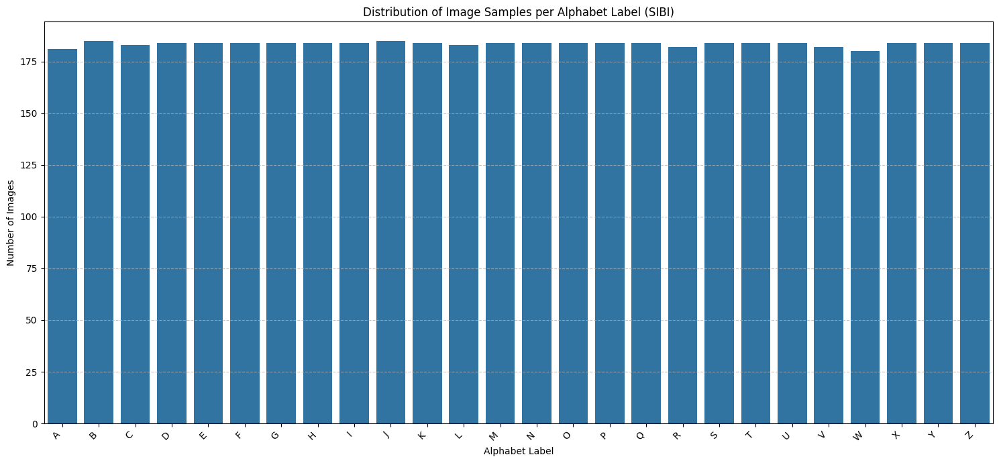

In [7]:
# Get list of all labels (subdirectories)
labels = sorted(os.listdir(dataset_path))

# Count images per label
label_counts = {}
for label in labels:
    label_dir = os.path.join(dataset_path, label)
    if os.path.isdir(label_dir):
        label_counts[label] = len(os.listdir(label_dir))

# Convert to DataFrame
df_counts = pd.DataFrame(label_counts.items(), columns=['Label', 'Count'])

# Display counts
print("Distribution of images per label:")
print(df_counts.sort_values(by='Count', ascending=False))

# Plot the distribution
plt.figure(figsize=(15, 7))
sns.barplot(x='Label', y='Count', data=df_counts)
plt.title('Distribution of Image Samples per Alphabet Label (SIBI)')
plt.xlabel('Alphabet Label')
plt.ylabel('Number of Images')
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

In [8]:
def get_image_absolute_paths(directory_path):
    """
    Retrieves the absolute paths of all images in a directory and its subdirectories.
    """
    # Define common image extensions
    extensions = (
        '*.jpg', '*.jpeg', '*.png', '*.bmp', '*.webp', '*.tiff',
        '*.JPG', '*.JPEG', '*.PNG', '*.BMP', '*.WEBP', '*.TIFF'
    )
    image_paths = []

    for ext in tqdm(extensions):
        # Use recursive glob pattern to find files in all subdirectories
        search_pattern = os.path.join(directory_path, '**', ext)

        # recursive=True is necessary to support the '**' wildcard
        found_files = glob.glob(search_pattern, recursive=True)

        # Convert each relative path to an absolute path
        absolute_files = [os.path.abspath(f) for f in found_files]
        image_paths.extend(absolute_files)

    image_paths = list(set(image_paths))

    return image_paths

In [9]:
import pandas as pd
import os

all_image_paths = get_image_absolute_paths(dataset_path)

# Create an initial DataFrame from all image paths
df = pd.DataFrame({
    'file_path': all_image_paths,
    'label': [os.path.basename(os.path.dirname(f)) for f in all_image_paths]
})
print(f"Initial DataFrame created with {len(df)} entries.")

100%|██████████| 12/12 [00:00<00:00, 56.40it/s]

Initial DataFrame created with 4759 entries.


## Data Cleaning

### Pemeriksaan Integritas Gambar

In [10]:
valid_indices = []
corrupted_files = []

# Iterasi langsung melalui kolom 'file_path' di DataFrame awal
for idx, image_path in df['file_path'].items():
    try:
        with Image.open(image_path) as img:
            img.verify() # Memeriksa integritas file
        valid_indices.append(idx)
    except (IOError, SyntaxError, Exception) as e:
        corrupted_files.append((image_path, str(e)))

# Filter DataFrame awal hanya untuk baris dengan gambar yang valid
df_clean = df.loc[valid_indices].reset_index(drop=True)

print("\n--- Hasil Pemeriksaan Gambar ---")
print(f"Total file yang diperiksa: {len(df)}")
print(f"File yang dapat diakses: {len(valid_indices)}")
print(f"File yang rusak atau tidak dapat diakses: {len(corrupted_files)}")

if corrupted_files:
    print(f"\n{len(corrupted_files)} file yang rusak atau tidak dapat diakses ditemukan.")
else:
    print("\nTidak ada file yang rusak ditemukan. Semua gambar dapat diakses.")


--- Hasil Pemeriksaan Gambar ---
Total file yang diperiksa: 4759
File yang dapat diakses: 4466
File yang rusak atau tidak dapat diakses: 293

293 file yang rusak atau tidak dapat diakses ditemukan.


### Pemeriksaan Data Duplikat

In [11]:
def get_hash(fname):
    hash_md5 = hashlib.md5()
    with open(fname, "rb") as f:
        for chunk in iter(lambda: f.read(4096), b""):
            hash_md5.update(chunk)
    return hash_md5.hexdigest()

# Gunakan defaultdict untuk menyimpan list index dari setiap hash
hash_dict = defaultdict(list)

# 1. Kelompokkan index berdasarkan hash gambar
for idx, path in df_clean['file_path'].items():
    file_hash = get_hash(path)
    hash_dict[file_hash].append(idx)

indices_to_drop = []
duplicate_groups_count = 0

# 2. Periksa mana hash yang memiliki lebih dari 1 file
for file_hash, indices in hash_dict.items():
    if len(indices) > 1:
        # Masukkan SEMUA index di kelompok ini ke daftar yang akan dihapus
        indices_to_drop.extend(indices)
        duplicate_groups_count += 1

print(f"\n--- Hasil Pemeriksaan Duplikat secara Menyeluruh ---")
print(f"Ditemukan {duplicate_groups_count} kelompok gambar yang kembar.")
print(f"Total ada {len(indices_to_drop)} file yang akan dihapus karena terindikasi duplikat.")

# 3. Hapus SEMUA baris yang terlibat duplikasi
if indices_to_drop:
    df_final = df_clean.drop(indices_to_drop).reset_index(drop=True)
    print(f"\nBerhasil membuang semua file duplikat")
    print(f"DataFrame akhir (df_final) memiliki {len(df_final)} baris data.")
else:
    df_final = df_clean.copy()
    print("Tidak ada file duplikat yang ditemukan. DataFrame aman.")


--- Hasil Pemeriksaan Duplikat secara Menyeluruh ---
Ditemukan 2 kelompok gambar yang kembar.
Total ada 4 file yang akan dihapus karena terindikasi duplikat.

Berhasil membuang semua file duplikat
DataFrame akhir (df_final) memiliki 4462 baris data.


/tmp/ipykernel_7292/4223511679.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Label', y='Count', data=df_counts, palette='viridis')


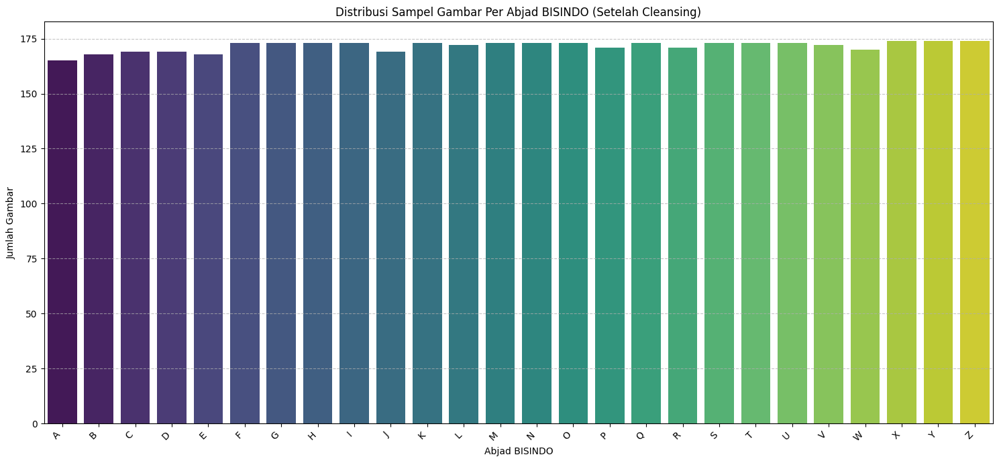

Total gambar yang siap digunakan: 4462


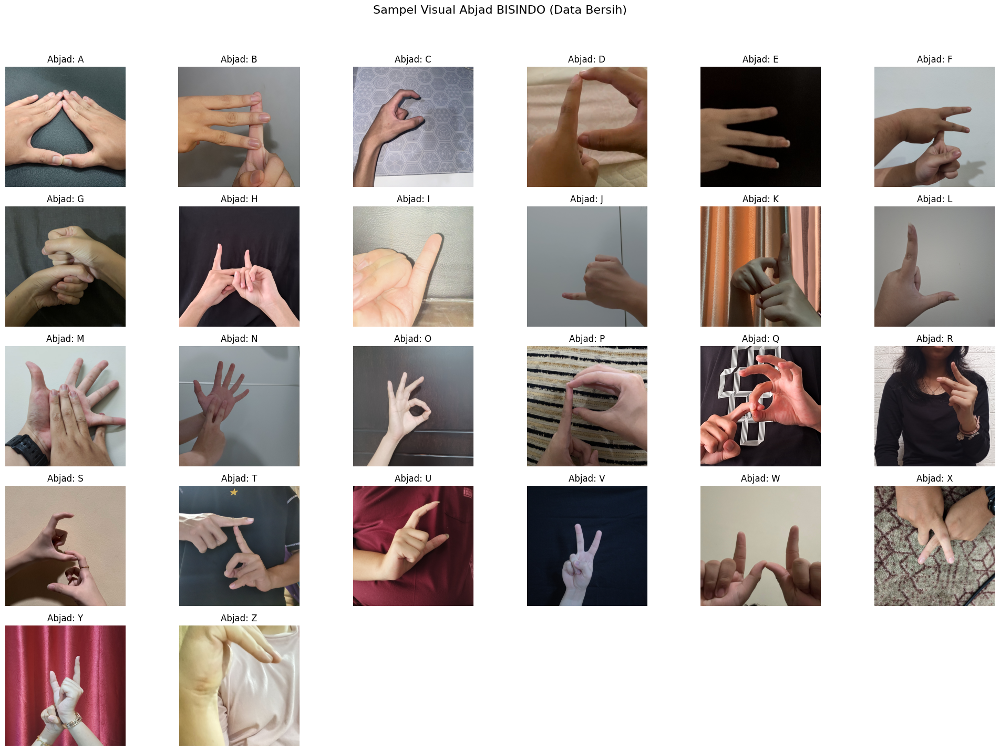

In [12]:
# VISUALISASI DISTRIBUSI KELAS (BARPLOT)

# Membuat df_counts berdasarkan df_final yang sudah bersih
df_counts = df_final['label'].value_counts().rename_axis('Label').reset_index(name='Count')

# Mengurutkan berdasarkan abjad agar rapi di grafik
df_counts = df_counts.sort_values(by='Label')

plt.figure(figsize=(15, 7))
sns.barplot(x='Label', y='Count', data=df_counts, palette='viridis')
plt.title('Distribusi Sampel Gambar Per Abjad BISINDO (Setelah Cleansing)')
plt.xlabel('Abjad BISINDO')
plt.ylabel('Jumlah Gambar')
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

print(f"Total gambar yang siap digunakan: {df_counts['Count'].sum()}")

# MENAMPILKAN SAMPEL GAMBAR BISINDO

plt.figure(figsize=(20, 15))

# Mengambil daftar label unik yang sudah diurutkan dari df_final
unique_labels = sorted(df_final['label'].unique())

for i, label in enumerate(unique_labels):
    # Mengambil baris pertama (index 0) dari setiap kelompok label sebagai sampel
    sample_row = df_final[df_final['label'] == label].iloc[0]

    # Membuka gambar berdasarkan file_path di DataFrame
    img_path = sample_row['file_path']
    img = Image.open(img_path)

    # Grid 5x6 = 30 slot (cukup untuk 26 abjad)
    plt.subplot(5, 6, i+1)
    plt.imshow(img)
    plt.title(f"Abjad: {label}")
    plt.axis('off')

plt.suptitle("Sampel Visual Abjad BISINDO (Data Bersih)", fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

## Data Preprocessing

### Split Dataset

In [13]:
X = df_final['file_path']
y = df_final['label']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=SEED, stratify=y)

X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.2, random_state=SEED, stratify=y_train)

In [14]:
train_df = pd.DataFrame({'file_path': X_train, 'label': y_train})
val_df = pd.DataFrame({'file_path': X_val, 'label': y_val})
test_df = pd.DataFrame({'file_path': X_test, 'label': y_test})
print("panjang train", len(train_df))
print("panjang val", len(val_df))
print("panjang test", len(test_df))

panjang train 2855
panjang val 714
panjang test 893


In [15]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

datagen_val_test = ImageDataGenerator()
datagen_train = ImageDataGenerator(
    horizontal_flip=True,
    rotation_range=10,
    zoom_range=0.1,
    brightness_range=[0.8, 1.2]
)

BATCH_SIZE = 32

train_generator = datagen_train.flow_from_dataframe(
    dataframe=train_df,
    x_col='file_path',
    y_col='label',
    target_size=(224, 224),
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=True,
    seed=SEED
)

val_generator = datagen_val_test.flow_from_dataframe(
    dataframe=val_df,
    x_col='file_path',
    y_col='label',
    target_size=(224, 224),
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=True,
    seed = SEED
)

test_generator = datagen_val_test.flow_from_dataframe(
    dataframe=test_df,
    x_col='file_path',
    y_col='label',
    target_size=(224, 224),
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=False
)

Found 2855 validated image filenames belonging to 26 classes.
Found 714 validated image filenames belonging to 26 classes.
Found 893 validated image filenames belonging to 26 classes.


In [16]:
import tensorflow as tf

# early_stop = tf.keras.callbacks.EarlyStopping(
#     monitor='val_loss',
#     patience=5,
#     restore_best_weights=True,
#     verbose=1
# )

log_dir = os.path.join("logs", "fit", time.strftime("%Y%m%d-%H%M%S"))

tensorboard_callback = tf.keras.callbacks.TensorBoard(
    log_dir=log_dir,
    histogram_freq=1
)

save_path = '/content/model_bisindo_terbaik.keras'

checkpoint = tf.keras.callbacks.ModelCheckpoint(
    filepath=save_path,
    monitor='val_accuracy',
    mode='max',
    save_best_only=True,
    verbose=1
)

class myCallback(tf.keras.callbacks.Callback):
  def on_epoch_end(self, epoch, logs={}):
    if(logs.get('accuracy') > 0.85 and logs.get('val_accuracy') > 0.85):
      print("\nAkurasi dan Val Akurasi sudah > 85%, training dihentikan!")
      self.model.stop_training = True

my_callback = myCallback()

In [17]:
inputs = Input(shape=(224, 224, 3))
x = tf.keras.applications.mobilenet_v2.preprocess_input(inputs)

# 4. Load base model MobileNetV2 (Gunakan input tensor 'x' yang sudah dipreprocess)
base_model = MobileNetV2(
    input_tensor=x,
    weights='imagenet',
    include_top=False
)

# 5. Freeze base model agar weight imagenet tidak berubah di awal training
base_model.trainable = True

fine_tune_at = 100

for layer in base_model.layers[:fine_tune_at]:
    layer.trainable = False

# 6. Menambahkan custom layers (Head)
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(256, activation='relu')(x)
x = Dropout(0.3)(x)
predictions = Dense(26, activation='softmax')(x)

model = Model(inputs=inputs, outputs=predictions)
optimizer = tf.keras.optimizers.Adam(learning_rate=0.0001)

model.compile(
    optimizer=optimizer,
    loss='categorical_crossentropy',
    metrics=['accuracy', 'mae']
)

model.summary()

/tmp/ipykernel_7292/1697037958.py:5: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  base_model = MobileNetV2(


9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ true_divide         │ (None, 224, 224,  │          0 │ input_layer[0][0] │
│ (TrueDivide)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ subtract (Subtract) │ (None, 224, 224,  │          0 │ true_divide[0][0] │
│                     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1 (Conv2D)      │ (None, 112, 112,  │        864 │ subtract[0][0]    │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bn_Conv1            │ (None, 112, 112,  │        128 │ Conv1[0][0]       │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1_relu (ReLU)   │ (None, 112, 112,  │          0 │ bn_Conv1[0][0]    │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 112, 112,  │        288 │ Conv1_relu[0][0]  │
│ (DepthwiseConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 112, 112,  │        128 │ expanded_conv_de… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 112, 112,  │          0 │ expanded_conv_de… │
│ (ReLU)              │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 112, 112,  │        512 │ expanded_conv_de… │
│ (Conv2D)            │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 112, 112,  │         64 │ expanded_conv_pr… │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand      │ (None, 112, 112,  │      1,536 │ expanded_conv_pr… │
│ (Conv2D)            │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_BN   │ (None, 112, 112,  │        384 │ block_1_expand[0… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_relu │ (None, 112, 112,  │          0 │ block_1_expand_B… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_pad         │ (None, 113, 113,  │          0 │ block_1_expand_r… │
│ (ZeroPadding2D)     │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise   │ (None, 56, 56,    │        864 │ block_1_pad[0][0] │
│ (DepthwiseConv2D)   │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 56, 56,    │        384 │ block_1_depthwis

 Total params: 2,592,602 (9.89 MB)

 Trainable params: 2,196,058 (8.38 MB)

 Non-trainable params: 396,544 (1.51 MB)

In [18]:
# Melatih model
EPOCHS = 50

history = model.fit(
    train_generator,
    validation_data=val_generator,
    epochs=EPOCHS,
    callbacks=[my_callback, checkpoint, tensorboard_callback],
)

Epoch 1/50
90/90 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.0941 - loss: 3.2816 - mae: 0.0728
Epoch 1: val_accuracy improved from None to 0.24930, saving model to /content/model_bisindo_terbaik.keras

Epoch 1: finished saving model to /content/model_bisindo_terbaik.keras
90/90 ━━━━━━━━━━━━━━━━━━━━ 382s 4s/step - accuracy: 0.1821 - loss: 2.9404 - mae: 0.0708 - val_accuracy: 0.2493 - val_loss: 2.5065 - val_mae: 0.0673
Epoch 2/50
90/90 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.5323 - loss: 1.6800 - mae: 0.0548
Epoch 2: val_accuracy improved from 0.24930 to 0.60504, saving model to /content/model_bisindo_terbaik.keras

Epoch 2: finished saving model to /content/model_bisindo_terbaik.keras
90/90 ━━━━━━━━━━━━━━━━━━━━ 319s 4s/step - accuracy: 0.5923 - loss: 1.4425 - mae: 0.0491 - val_accuracy: 0.6050 - val_loss: 1.3112 - val_mae: 0.0438
Epoch 3/50
90/90 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.7793 - loss: 0.7604 - mae: 0.0304
Epoch 3: val_accuracy improved from 0.60504 to 0.70588

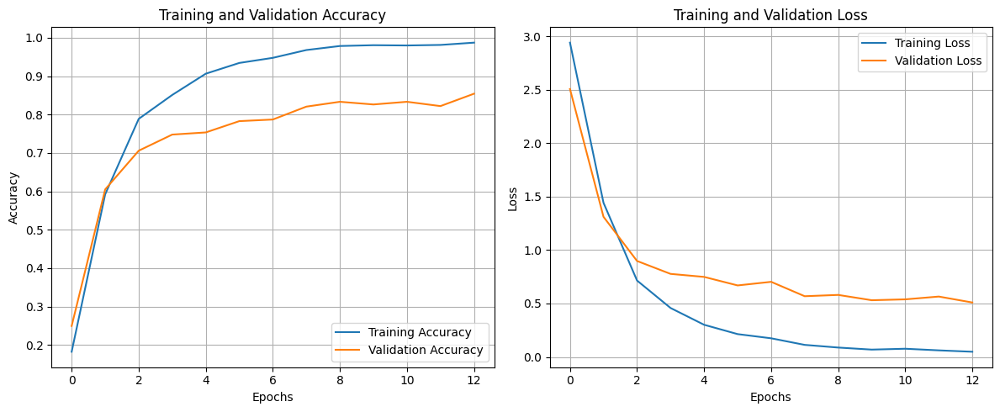

In [19]:
# Visualisasi akurasi dan loss dari history pelatihan
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs_range = range(len(acc))

plt.figure(figsize=(12, 5))

# Grafik Akurasi
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend(loc='lower right')
plt.grid(True)

# Grafik Loss
plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend(loc='upper right')
plt.grid(True)

plt.tight_layout()
plt.show()

### Visualisasi dengan TensorBoard

Bagian ini memungkinkan kita untuk melihat grafik interaktif dari metrik pelatihan (accuracy, loss, dsb) secara real-time maupun setelah pelatihan selesai menggunakan TensorBoard.

In [20]:
%load_ext tensorboard

# Membuka TensorBoard menggunakan direktori log yang telah ditentukan sebelumnya
%tensorboard --logdir logs/fit

<IPython.core.display.Javascript object>

In [ ]:
output_dir = '/content'

keras_path = os.path.join(output_dir, 'model_bisindo.keras')
model.save(keras_path)
print(f"Model Keras Tersimpan: {keras_path}")

saved_model_dir = '/content/saved_model'
tfjs_dir = '/content/tfjs_model'

# Export ke format SavedModel
model.export(saved_model_dir)
print(f"SavedModel berhasil dibuat di: {saved_model_dir}")

#Konversi ke TFJS
!tensorflowjs_converter \
    --input_format=tf_saved_model \
    {saved_model_dir} \
    {tfjs_dir}

shutil.make_archive(tfjs_dir, 'zip', tfjs_dir)
print(f"Selesai! Model TFJS siap didownload: {tfjs_dir}.zip")

# Convert SavedModel ke TFLite
converter = tf.lite.TFLiteConverter.from_saved_model("saved_model")

tflite_model = converter.convert()

# Simpan model
with open("model.tflite", "wb") as f:
    f.write(tflite_model)

print("Model berhasil disimpan ke TFLite")

In [22]:
folder_to_zip = '/content/saved_model'
output_zip_name = '/content/saved_model'

# Remove existing zip file if it exists to ensure a fresh archive
if os.path.exists(output_zip_name + '.zip'):
    os.remove(output_zip_name + '.zip')
    print(f"Removed existing {output_zip_name}.zip")

shutil.make_archive(output_zip_name, 'zip', folder_to_zip)
print(f"Folder '{folder_to_zip}' has been zipped to '{output_zip_name}.zip'")

Folder '/content/saved_model' has been zipped to '/content/saved_model.zip'


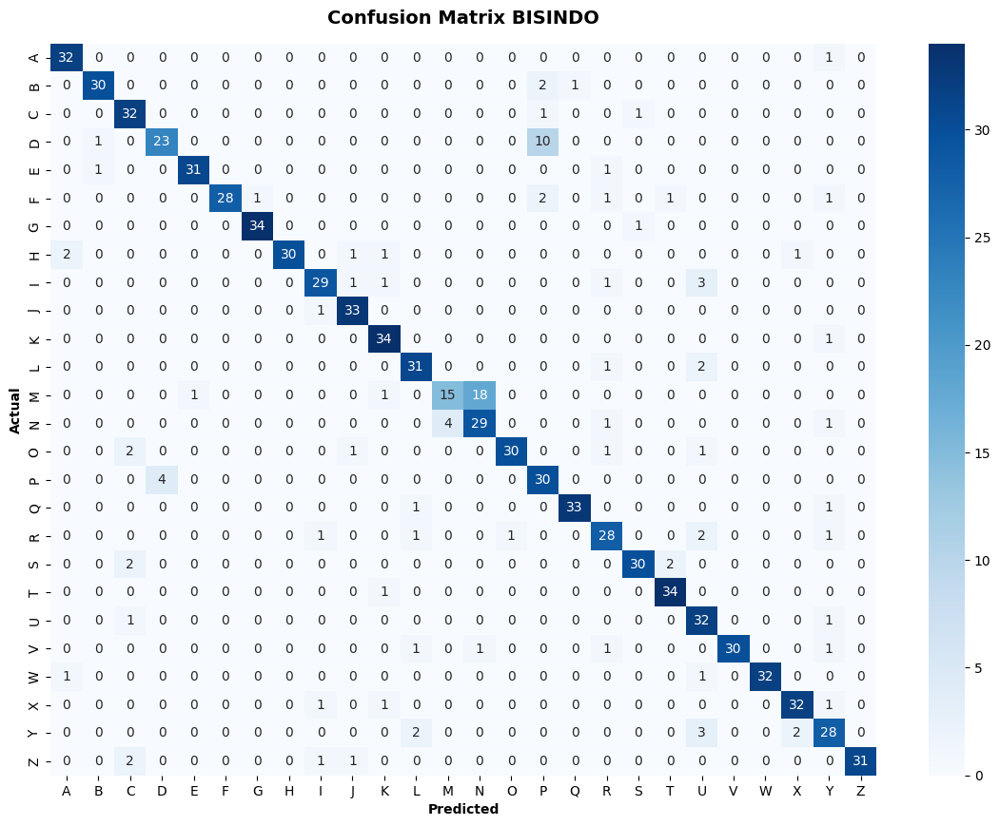


Classification Report:
              precision    recall  f1-score   support

           A     0.9143    0.9697    0.9412        33
           B     0.9375    0.9091    0.9231        33
           C     0.8205    0.9412    0.8767        34
           D     0.8519    0.6765    0.7541        34
           E     0.9688    0.9394    0.9538        33
           F     1.0000    0.8235    0.9032        34
           G     0.9714    0.9714    0.9714        35
           H     1.0000    0.8571    0.9231        35
           I     0.8788    0.8286    0.8529        35
           J     0.8919    0.9706    0.9296        34
           K     0.8718    0.9714    0.9189        35
           L     0.8611    0.9118    0.8857        34
           M     0.7895    0.4286    0.5556        35
           N     0.6042    0.8286    0.6988        35
           O     0.9677    0.8571    0.9091        35
           P     0.6667    0.8824    0.7595        34
           Q     0.9706    0.9429    0.9565        35
   

In [27]:
# Reset generator
test_generator.reset()

# Prediksi menggunakan data test
preds = model.predict(test_generator, verbose=0)
pred_classes = np.argmax(preds, axis=1)

# Ambil label asli
true_classes = test_generator.classes
class_labels = list(test_generator.class_indices.keys())

# Print Confusion Matrix
cm = confusion_matrix(true_classes, pred_classes)
plt.figure(figsize=(14, 10)) # Diperbesar agar 26 abjad tidak berdesakan
sns.heatmap(cm, annot=True, fmt='d', xticklabels=class_labels, yticklabels=class_labels, cmap='Blues')
plt.xlabel('Predicted', fontweight='bold')
plt.ylabel('Actual', fontweight='bold')
plt.title('Confusion Matrix BISINDO', fontsize=14, fontweight='bold', pad=15)
plt.show()

# Print Classification Report
print("\nClassification Report:")
print(classification_report(true_classes, pred_classes, target_names=class_labels, digits=4))

In [26]:
labels = list("ABCDEFGHIJKLMNOPQRSTUVWXYZ")

uploader = widgets.FileUpload(
    accept='image/*',
    multiple=False
)

output_tampilan = widgets.Output()

def proses_prediksi(change):
    with output_tampilan:
        clear_output()

        try:
            if isinstance(uploader.value, tuple) or isinstance(uploader.value, list):
                content = uploader.value[0].content if hasattr(uploader.value[0], 'content') else uploader.value[0]['content']
            else:
                nama_file = list(uploader.value.keys())[0]
                content = uploader.value[nama_file]['content']

            img = Image.open(io.BytesIO(content)).convert('RGB')

            img_resized = img.resize((224, 224))
            img_array = image.img_to_array(img_resized)
            img_array = np.expand_dims(img_array, axis=0)

            preds = model.predict(img_array, verbose=0)
            idx_tertinggi = np.argmax(preds[0])
            label_pred = labels[idx_tertinggi]
            akurasi = np.max(preds[0]) * 100

            plt.figure(figsize=(5, 5))
            plt.imshow(img)
            plt.axis('off')
            plt.title(f"Hasil Prediksi: {label_pred}\nKeyakinan: {akurasi:.2f}%",
                      fontsize=16, fontweight='bold', color='darkblue')
            plt.show()

        except Exception as e:
            print(f"Terjadi kesalahan saat memproses gambar: {e}")

uploader.observe(proses_prediksi, names='value')

print("Silakan klik tombol 'Upload' di bawah ini untuk mencoba model BISINDO-mu:")
display(uploader, output_tampilan)

Silakan klik tombol 'Upload' di bawah ini untuk mencoba model BISINDO-mu:


FileUpload(value={}, accept='image/*', description='Upload')

Output()

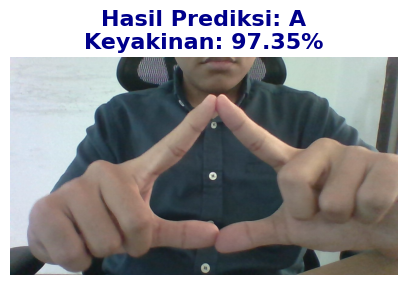

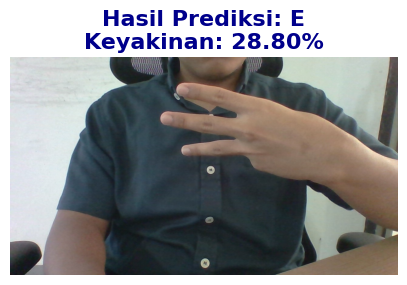

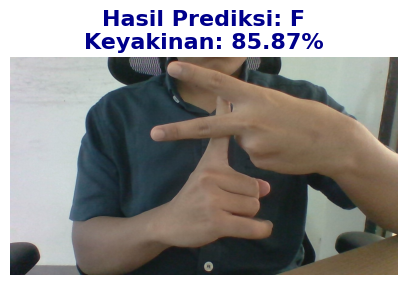